<a href="https://colab.research.google.com/github/zw2497/Cycle_GAN_Tutorial/blob/master/cycle_gan_v3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
!pip -q install tensorflow-gpu==2.0.0-alpha0

# Import TensorFlow and other libraries

In [0]:
import tensorflow as tf
from tensorflow.keras import Model
from tensorflow.keras.losses import mean_squared_error, mean_absolute_error

import os
import time
import matplotlib.pyplot as plt
from IPython.display import clear_output
import numpy as np

# Load and prepare the dataset

In [0]:
%%bash
mkdir datasets
FILE=apple2orange

if [[ $FILE != "ae_photos" && $FILE != "apple2orange" && $FILE != "summer2winter_yosemite" &&  $FILE != "horse2zebra" && $FILE != "monet2photo" && $FILE != "cezanne2photo" && $FILE != "ukiyoe2photo" && $FILE != "vangogh2photo" && $FILE != "maps" && $FILE != "cityscapes" && $FILE != "facades" && $FILE != "iphone2dslr_flower" && $FILE != "ae_photos" ]]; then
    echo "Available datasets are: apple2orange, summer2winter_yosemite, horse2zebra, monet2photo, cezanne2photo, ukiyoe2photo, vangogh2photo, maps, cityscapes, facades, iphone2dslr_flower, ae_photos"
    exit 1
fi

URL=https://people.eecs.berkeley.edu/~taesung_park/CycleGAN/datasets/$FILE.zip
ZIP_FILE=./datasets/$FILE.zip
TARGET_DIR=./datasets/$FILE/
wget -N $URL -O $ZIP_FILE
mkdir $TARGET_DIR
unzip $ZIP_FILE -d ./datasets/
rm $ZIP_FILE

Archive:  ./datasets/apple2orange.zip
  inflating: ./datasets/ILE          


mkdir: cannot create directory ‘datasets’: File exists
for details.

--2019-05-08 15:23:41--  https://people.eecs.berkeley.edu/~taesung_park/CycleGAN/datasets/apple2orange.zip
Resolving people.eecs.berkeley.edu (people.eecs.berkeley.edu)... 128.32.189.73
Connecting to people.eecs.berkeley.edu (people.eecs.berkeley.edu)|128.32.189.73|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 78456409 (75M) [application/zip]
Saving to: ‘./datasets/apple2orange.zip’

     0K .......... .......... .......... .......... ..........  0% 1.82M 41s
    50K .......... .......... .......... .......... ..........  0% 2.48M 36s
   100K .......... .......... .......... .......... ..........  0% 2.48M 34s
   150K .......... .......... .......... .......... ..........  0%  133M 25s
   200K .......... .......... .......... .......... ..........  0% 17.0M 21s
   250K .......... .......... .......... .......... ..........  0% 49.7M 18s
   300K .......... .......... .......... .......... ..

In [0]:
# load and prepocessing function from dataset
def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image)
    image = tf.cast(image, tf.float32)
    return image

def load_image_train(image_file):
    input_image = load(image_file)
    input_image = normalize(input_image)
    return input_image

In [0]:
def normalize(input_image):
    input_image = (input_image / 127.5) - 1
    return input_image

(256, 256, 3)


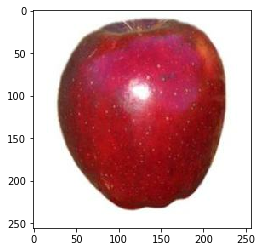

In [0]:
PATH = './datasets/apple2orange/'
inpA = load(os.path.join(PATH, 'trainA/n07740461_10067.jpg'))
print(inpA.shape)
# casting to int for matplotlib to show the image
plt.figure()
plt.imshow(inpA/255.0)

(256, 256, 3)


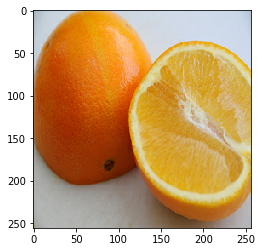

In [0]:
inpB = load(os.path.join(PATH, 'trainB/n07749192_10205.jpg'))
print(inpB.shape)

plt.figure()
plt.imshow(inpB/255)

In [0]:
BATCH_SIZE = 1
base_dir = '/content/datasets/apple2orange/'
BUFFER_SIZE = 32

trainA_dataset = tf.data.Dataset.list_files(PATH+'trainA/*.jpg')
trainA_dataset = trainA_dataset.shuffle(BUFFER_SIZE)
trainA_dataset = trainA_dataset.map(load_image_train)
trainA_dataset = trainA_dataset.batch(BATCH_SIZE, drop_remainder=True)
trainA_dataset = trainA_dataset.prefetch(buffer_size=1)

trainB_dataset = tf.data.Dataset.list_files(PATH+'trainB/*.jpg')
trainB_dataset = trainB_dataset.shuffle(BUFFER_SIZE)
trainB_dataset = trainB_dataset.map(load_image_train)
trainB_dataset = trainB_dataset.batch(BATCH_SIZE, drop_remainder=True)
trainB_dataset = trainB_dataset.prefetch(buffer_size=1)

In [0]:
ingA = next(iter(trainA_dataset))
ingB = next(iter(trainB_dataset))

print(ingA.numpy().max(), ingA.numpy().min())
print(ingB.numpy().max(), ingB.numpy().min())

1.0 -1.0
1.0 -1.0


# Model Building

# Generator

Refer to: https://www.tensorflow.org/alpha/tutorials/generative/pix2pix

In [0]:
def downsample(filters, size=3, apply_batchnorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))
    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())
    result.add(tf.keras.layers.LeakyReLU())

    return result

test downsample


In [0]:
# 256,256,3 => 1,256,256,3 => 1,128,128,3 => 128, 128, 3
down_model = downsample(3)
down_result = down_model(tf.expand_dims(inpA, 0))
print(down_result.shape)

(1, 128, 128, 3)


In [0]:
def upsample(filters, size=4, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

    result.add(tf.keras.layers.BatchNormalization())

    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))

    result.add(tf.keras.layers.ReLU())

    return result

test upsample

In [0]:
up_model = upsample(3)
up_result = up_model(down_result)
print(up_result.shape)

(1, 256, 256, 3)


In [0]:
class ResnetIdentityBlock(tf.keras.Model):
  def __init__(self, kernel_size, filters):
    super(ResnetIdentityBlock, self).__init__(name='')
    filters1, filters2, filters3 = filters

    self.conv2a = tf.keras.layers.Conv2D(filters1, (1, 1))
    self.bn2a = tf.keras.layers.BatchNormalization()

    self.conv2b = tf.keras.layers.Conv2D(filters2, kernel_size, padding='same')
    self.bn2b = tf.keras.layers.BatchNormalization()

    self.conv2c = tf.keras.layers.Conv2D(filters3, (1, 1))
    self.bn2c = tf.keras.layers.BatchNormalization()

  def call(self, input_tensor, training=False):
    x = self.conv2a(input_tensor)
    x = self.bn2a(x, training=training)
    x = tf.nn.relu(x)

    x = self.conv2b(x)
    x = self.bn2b(x, training=training)
    x = tf.nn.relu(x)

    x = self.conv2c(x)
    x = self.bn2c(x, training=training)

    x += input_tensor
    return tf.nn.relu(x)

    
block1 = ResnetIdentityBlock(3, [512, 512, 512])
block2 = ResnetIdentityBlock(3, [512, 512, 512])
block3 = ResnetIdentityBlock(3, [512, 512, 512])

resnet = [block1, block2, block3]
print(block1(tf.zeros([1, 16, 16, 512])).shape)
print([x.name for x in block1.trainable_variables])

(1, 16, 16, 512)
['resnet_identity_block_26/conv2d_125/kernel:0', 'resnet_identity_block_26/conv2d_125/bias:0', 'resnet_identity_block_26/batch_normalization_v2_139/gamma:0', 'resnet_identity_block_26/batch_normalization_v2_139/beta:0', 'resnet_identity_block_26/conv2d_126/kernel:0', 'resnet_identity_block_26/conv2d_126/bias:0', 'resnet_identity_block_26/batch_normalization_v2_140/gamma:0', 'resnet_identity_block_26/batch_normalization_v2_140/beta:0', 'resnet_identity_block_26/conv2d_127/kernel:0', 'resnet_identity_block_26/conv2d_127/bias:0', 'resnet_identity_block_26/batch_normalization_v2_141/gamma:0', 'resnet_identity_block_26/batch_normalization_v2_141/beta:0']


In [0]:
def Generator():
    down_stack = [
        downsample(64, 4, apply_batchnorm=False), # (bs, 128, 128, 64)
        downsample(128, 4), # (bs, 64, 64, 128)
        downsample(256, 4), # (bs, 32, 32, 256)
        downsample(512, 4) # (bs, 32, 32, 256)
    ]

    up_stack = [
        upsample(256, 4),
        upsample(128, 4), # (bs, 64, 64, 256)
        upsample(64, 4), # (bs, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(3, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh') # (bs, 256, 256, 3)

    concat = tf.keras.layers.Concatenate()

    inputs = tf.keras.layers.Input(shape=[256, 256, 3])
    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
        
    for block in resnet:
        x = block(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = concat([x, skip])

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

In [0]:
generator = Generator()

(1, 256, 256, 3) 1.0 0.0


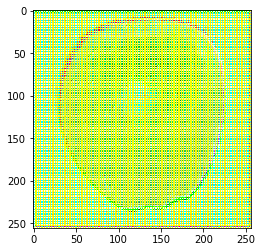

In [0]:
gen_output = generator(tf.expand_dims(inpA, 0), training=False)
gen_output = (gen_output + 1) / 2
plt.imshow(gen_output[0])
print(gen_output.shape,gen_output[0,...].numpy().max(), gen_output[0,...].numpy().min())

In [0]:
generator.summary()

Model: "model_6"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_11 (InputLayer)           [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
sequential_68 (Sequential)      (None, 128, 128, 64) 3072        input_11[0][0]                   
__________________________________________________________________________________________________
sequential_69 (Sequential)      (None, 64, 64, 128)  131584      sequential_68[0][0]              
__________________________________________________________________________________________________
sequential_70 (Sequential)      (None, 32, 32, 256)  525312      sequential_69[0][0]              
____________________________________________________________________________________________

# Discriminator

In [0]:
def Discriminator():
    inputs = tf.keras.layers.Input(shape=[None,None,3])
    x = inputs
    g_filter = 64
    
    down_stack = [
        downsample(g_filter),
        downsample(g_filter * 2),
        downsample(g_filter * 4),
        downsample(g_filter * 8),
    ]
    
    for down in down_stack:
        x = down(x)

    last = tf.keras.layers.Conv2D(1, 4, strides=1, padding='same') # (bs, 30, 30, 1)
    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

In [0]:
discriminator = Discriminator()
dis_output = discriminator(tf.expand_dims(inpA, 0), training=False)
print(dis_output.shape)

(1, 16, 16, 1)


## Start Training


In [0]:
def clip(img):
    return (img + 1) / 2

In [0]:
EPOCHS = 200

In [0]:
opti = tf.keras.optimizers.Adam(0.0002, 0.5)

In [0]:
d_A = Discriminator()
d_B = Discriminator()

g_AB = Generator()
g_BA = Generator()

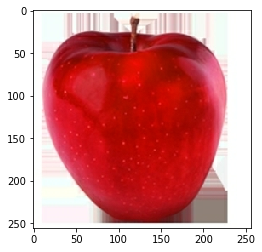

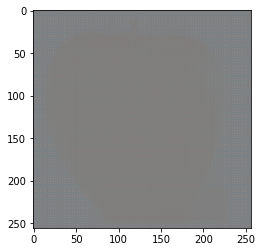

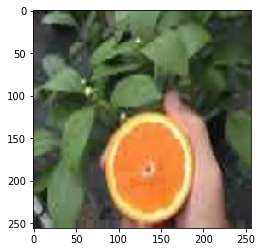

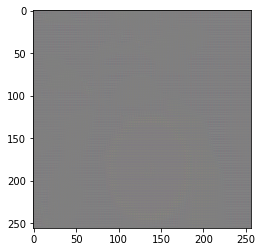

In [0]:
fake_B = g_AB(ingA, training=False)
fake_A = g_BA(ingB, training=False)
logits_A = d_A(ingA, training=False)
logits_B = d_B(ingB, training=False)

plt.figure()
plt.imshow(clip(ingA[0]))
plt.figure()
plt.imshow(clip(fake_B[0]))
plt.figure()
plt.imshow(clip(ingB[0]))
plt.figure()
plt.imshow(clip(fake_A[0]))

In [0]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [0]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

In [0]:
generator_optimizer_AB = tf.keras.optimizers.Adam(1e-4, beta_1=0.5)
generator_optimizer_BA = tf.keras.optimizers.Adam(1e-4, beta_1=0.5)
discriminator_optimizer_A = tf.keras.optimizers.Adam(1e-4, beta_1=0.5)
discriminator_optimizer_B = tf.keras.optimizers.Adam(1e-4, beta_1=0.5)

In [0]:
@tf.function
def train_discriminator(imgs_A, imgs_B):   

    """
    discriminator A
    """
    with tf.GradientTape() as dA_tape:
        logits_real_A = d_A(imgs_A, training=True)
        
        fake_A = g_BA(imgs_B, training=False)
        logits_fake_A = d_A(fake_A, training=True)
        
        dA_loss = discriminator_loss(logits_real_A, logits_fake_A)
        
    gradients_of_dA = dA_tape.gradient(dA_loss, d_A.trainable_variables)
    discriminator_optimizer_A.apply_gradients(zip(gradients_of_dA, d_A.trainable_variables))

    
    """
    discriminator B
    """
    with tf.GradientTape() as dB_tape:
        logits_real_B = d_B(imgs_B, training=True)
        
        fake_B = g_AB(imgs_A, training=False)
        logits_fake_B = d_B(fake_B, training=True)

        dB_loss = discriminator_loss(logits_real_B, logits_fake_B)

    gradients_of_dB = dB_tape.gradient(dB_loss, d_B.trainable_variables)
    discriminator_optimizer_B.apply_gradients(zip(gradients_of_dB, d_B.trainable_variables))

    return [dA_loss, dB_loss]

In [0]:
@tf.function
def train_generator(imgs_A, imgs_B):
    with tf.GradientTape() as g:     
        valid = np.ones((BATCH_SIZE, 16, 16, 1)).astype('float32')
        fake = np.zeros((BATCH_SIZE, 16, 16, 1)).astype('float32')
        
        fake_B = g_AB(imgs_A, training=True)
        fake_A = g_BA(imgs_B, training=True)
        
        # Translate images back to original domain
        reconstr_A = g_BA(fake_B, training=True)
        reconstr_B = g_AB(fake_A, training=True)
        
        # Identity mapping of images
        img_A_id = g_BA(imgs_A, training=True)
        img_B_id = g_AB(imgs_B, training=True)

        valid_A = d_A(fake_A, training=False)
        valid_B = d_B(fake_B, training=False)

        gen_loss = [
            tf.math.reduce_mean(mean_squared_error(valid_A, valid)),
            tf.math.reduce_mean(mean_squared_error(valid_B, valid)),
            10 * tf.math.reduce_mean(mean_absolute_error(reconstr_A, imgs_A)),
            10 * tf.math.reduce_mean(mean_absolute_error(reconstr_B, imgs_B))
#             tf.math.reduce_mean(mean_absolute_error(img_A_id, imgs_A)),
#             tf.math.reduce_mean(mean_absolute_error(img_B_id, imgs_B))
        ]

    gradients_of_generator = g.gradient(gen_loss, g_AB.trainable_variables + g_BA.trainable_variables)
    opti.apply_gradients(zip(gradients_of_generator, g_AB.trainable_variables + g_BA.trainable_variables))
    return gen_loss

In [0]:
def train(train_A_dataset, train_B_dataset, epochs):
    for epoch in range(epochs):
        for batch_i, (imgs_A, imgs_B) in enumerate(zip(train_A_dataset, train_B_dataset)):
            start = time.time()
            d_loss = train_discriminator(imgs_A, imgs_B)
            g_loss = train_generator(imgs_A, imgs_B)
            if batch_i % 100 == 0:
                ingA = next(iter(trainA_dataset))
                ingB = next(iter(trainB_dataset))
                print ('Time taken for batch in {} epoch {} is {} sec\n'.format(batch_i, epoch, time.time()-start))
                print("discriminator A: ", d_loss[0].numpy())
                print("discriminator B: ", d_loss[1].numpy())
                print("generator: {}\n".format([i.numpy() for i in g_loss]))
                plt.figure()
                gen_output = g_AB(ingA, training=False)
                plt.imshow(clip(gen_output[0]))
                plt.show()
                plt.figure()
                gen_outputB = g_BA(ingB, training=False)
                plt.imshow(clip(gen_outputB[0]))
                plt.show()   
        print("The epoch now is ", epoch)

Time taken for batch in 0 epoch 0 is 7.4877612590789795 sec

discriminator A:  0.0030216624
discriminator B:  0.012631059
generator: [0.598045, 1.7836437, 1.837342, 1.8617928]



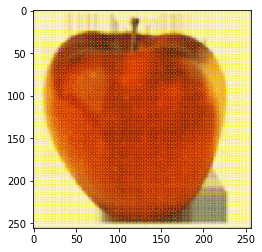

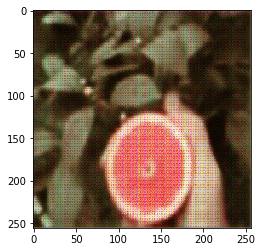

Time taken for batch in 100 epoch 0 is 1.3041701316833496 sec

discriminator A:  0.0020773604
discriminator B:  0.0030001285
generator: [0.7778906, 0.6648363, 1.958307, 1.5864265]



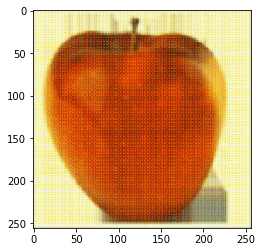

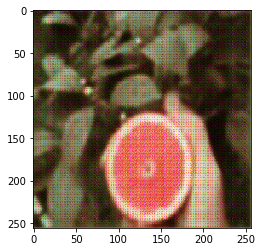

Time taken for batch in 200 epoch 0 is 1.3243498802185059 sec

discriminator A:  0.00044517202
discriminator B:  0.012626898
generator: [0.33562848, 9.373538, 1.4637573, 1.6569692]



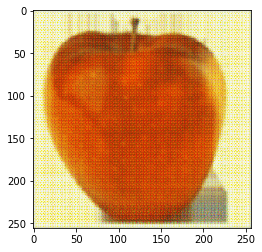

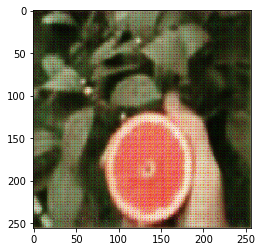

Time taken for batch in 300 epoch 0 is 1.3118042945861816 sec

discriminator A:  0.014563102
discriminator B:  0.009653882
generator: [1.3745415, 0.85754937, 2.7011676, 2.31655]



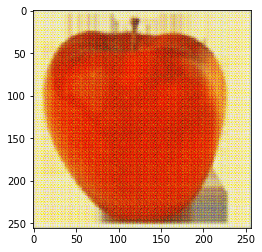

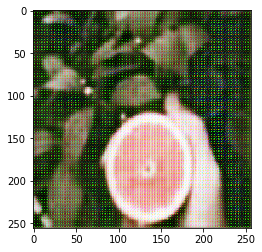

Time taken for batch in 400 epoch 0 is 1.3337769508361816 sec

discriminator A:  0.0029534963
discriminator B:  0.0019261953
generator: [0.648588, 0.6875078, 2.7689207, 1.9957525]



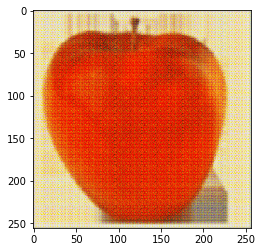

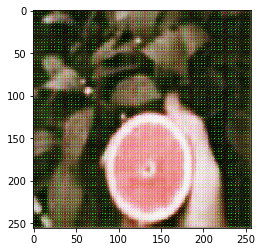

Time taken for batch in 500 epoch 0 is 1.4362998008728027 sec

discriminator A:  0.028386846
discriminator B:  0.002331681
generator: [0.7253005, 0.4793724, 2.721314, 1.8428771]



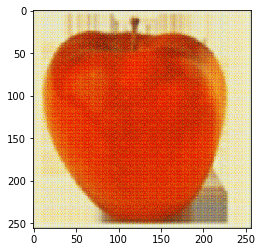

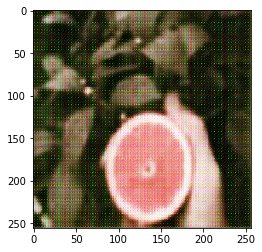

Time taken for batch in 600 epoch 0 is 1.3299131393432617 sec

discriminator A:  0.0057560313
discriminator B:  0.002226446
generator: [4.9873743, 0.42826125, 2.4342144, 2.0207162]



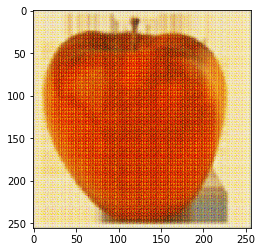

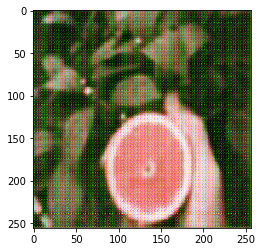

Time taken for batch in 700 epoch 0 is 1.331850290298462 sec

discriminator A:  0.003168219
discriminator B:  0.0024893566
generator: [0.48963696, 0.22531362, 1.7106557, 1.8811882]



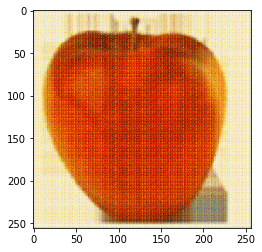

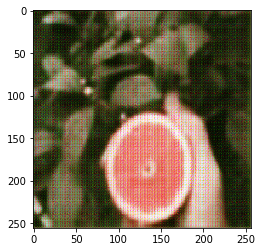

Time taken for batch in 800 epoch 0 is 1.3306999206542969 sec

discriminator A:  0.00082076277
discriminator B:  0.0017428559
generator: [0.2838042, 0.4550444, 1.6518074, 2.2687974]



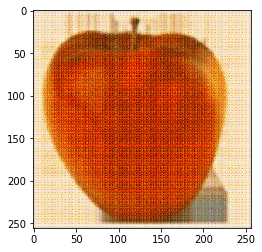

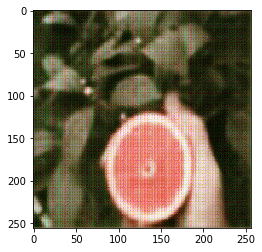

Time taken for batch in 900 epoch 0 is 1.34205961227417 sec

discriminator A:  0.0043922113
discriminator B:  0.00081873406
generator: [0.30230653, 0.21605092, 2.42815, 1.623029]



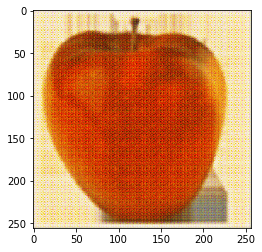

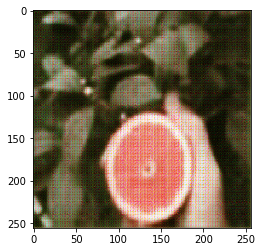

The epoch now is  0
Time taken for batch in 0 epoch 1 is 1.3219475746154785 sec

discriminator A:  0.0006659555
discriminator B:  0.018205151
generator: [0.23249394, 78.5051, 2.0505939, 1.8633701]



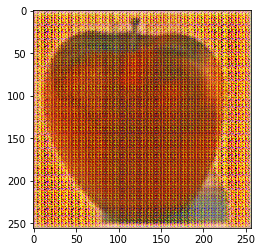

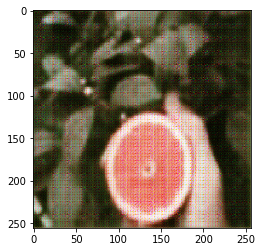

Time taken for batch in 100 epoch 1 is 1.3202102184295654 sec

discriminator A:  0.00054803933
discriminator B:  0.0007454845
generator: [0.49069363, 2.7230456, 1.8281835, 2.349219]



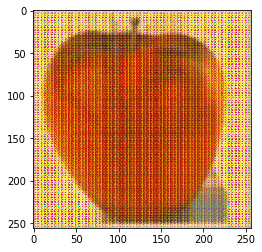

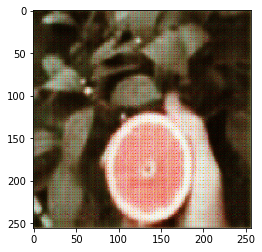

KeyboardInterrupt: ignored

In [0]:
train(trainA_dataset, trainB_dataset, EPOCHS)

In [0]:
fake_B = g_AB(ingA, training=False)
fake_A = g_BA(ingB, training=False)
logits_A = d_A(ingA, training=False)
logits_B = d_B(ingB, training=False)


plt.figure(dpi=100)
plt.imshow(clip(ingA[0]))
plt.figure(dpi=100)
plt.imshow(clip(fake_B[0]))
plt.figure(dpi=70)
plt.imshow(clip(ingB[0]))
plt.figure(dpi=70)
plt.imshow(clip(fake_A[0]))

In [0]:
fake_B = g_AB(img_A, training=False)
fake_A = g_BA(img_B, training=False)

plt.figure()
plt.imshow(img_A[0])
plt.figure()
plt.imshow(fake_B[0])
plt.figure()
plt.imshow(img_B[0])
plt.figure()
plt.imshow(fake_A[0])

In [0]:
d_A.load_weights('./d_A.h5')
d_B.load_weights('./d_B.h5')
g_AB.load_weights('./g_AB.h5')
g_BA.load_weights('./g_BA.h5')

In [0]:
PATH = './datasets/apple2orange/'
inpA = load_image_train(os.path.join(PATH, 'trainA/n07740461_10067.jpg'))
fake_B = g_AB(tf.expand_dims(inpA, 0), training=False)
print(fake_B.shape)
# casting to int for matplotlib to show the image
plt.figure()
plt.imshow(clip(fake_B[0]))

In [0]:
inpB = load_image_train(os.path.join(PATH, 'trainB/n07749192_10205.jpg'))
fake_A = g_BA(tf.expand_dims(inpB, 0), training=False)
print(fake_A.shape)
# casting to int for matplotlib to show the image
plt.figure()
plt.imshow(clip(fake_A[0]))

/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


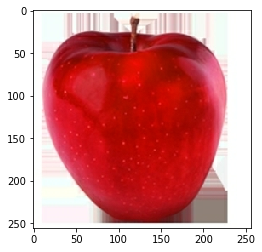

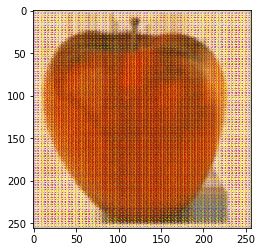

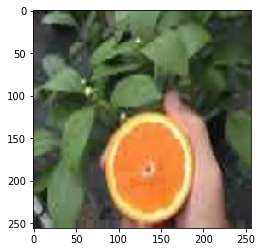

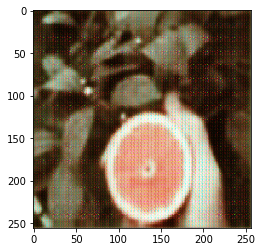

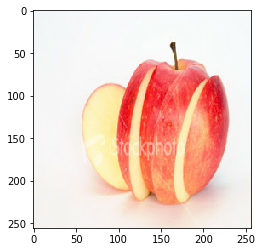

...

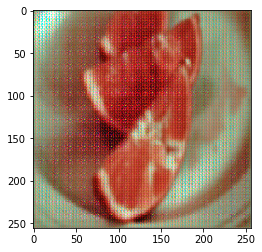

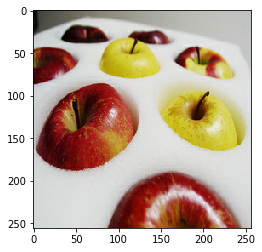

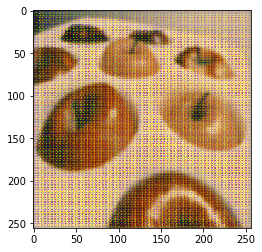

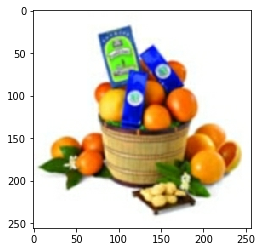

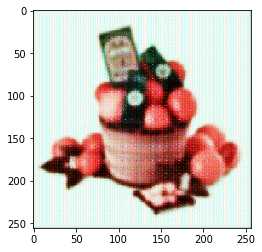

In [0]:
n = 20
for batch_i, (imgs_A, imgs_B) in enumerate(zip(trainA_dataset, trainB_dataset)):
    fake_B = g_AB(imgs_A, training=True)
    fake_A = g_BA(imgs_B, training=True)
    
    plt.figure()
    plt.imshow(clip(imgs_A[0]))
    plt.figure()
    plt.imshow(clip(fake_B[0]))
    plt.figure()
    plt.imshow(clip(imgs_B[0]))
    plt.figure()
    plt.imshow(clip(fake_A[0]))
    n -= 1
    if n < 0:
        break